In [3]:
from __future__ import print_function, division
import os
import torch
import pandas as pd              #用于更容易地进行csv解析
from skimage import io, transform    #用于图像的IO和变换
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils

# 忽略警告
import warnings
warnings.filterwarnings("ignore")

plt.ion()   # interactive mode

In [52]:
landmarks_frame = pd.read_csv("faces/face_landmarks.csv")
landmarks_frame
root_dir = os.path.dirname("faces/face_landmarks.csv")


'faces'

In [85]:
landmarks = landmarks_frame.iloc[n, 1:].values
landmarks = landmarks.astype(np.float32)
landmarks, landmarks.reshape(-1,2)

(array([ 66., 114.,  65., 128.,  67., 142.,  68., 156.,  72., 169.,  80.,
        180.,  91., 189., 103., 195., 115., 197., 128., 197., 139., 192.,
        148., 184., 154., 173., 160., 162., 164., 150., 169., 138., 171.,
        126.,  80., 101.,  87.,  95.,  98.,  92., 108.,  96., 116., 101.,
        139., 103., 147., 100., 156., 100., 164., 105., 168., 113., 127.,
        113., 127., 121., 126., 128., 126., 136., 115., 143., 119., 145.,
        124., 147., 128., 146., 132., 146.,  90., 112.,  97., 108., 104.,
        109., 110., 114., 103., 115.,  96., 114., 139., 118., 146., 114.,
        153., 116., 157., 121., 152., 122., 146., 121., 101., 163., 109.,
        157., 117., 155., 123., 157., 129., 156., 134., 160., 139., 168.,
        133., 171., 126., 172., 120., 172., 114., 171., 107., 168., 104.,
        162., 116., 161., 122., 162., 128., 162., 136., 167., 127., 166.,
        121., 165., 116., 164.], dtype=float32), array([[ 66., 114.],
        [ 65., 128.],
        [ 67., 142.]

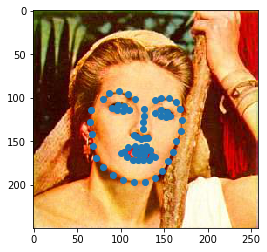

In [86]:

n = 2
img_name = landmarks_frame.iloc[n, 0]
landmarks = landmarks_frame.iloc[n, 1:].values #转numpy
landmarks = landmarks.astype(np.float32).reshape(-1,2) #转float类型方便乘法除法
#reshape(-1,2)是我们想让它有两列（x,y），但是行数不知道，-1可以自动计算行数
im = io.imread('faces/%s' % img_name) #%s是占位符，在这里相当于导入所有图片名字
#io.imread方法是读取图片，并把它保存成numpy的数据

plt.imshow(im)#打印图片
plt.scatter(landmarks[:,0], landmarks[:,1])
plt.show()

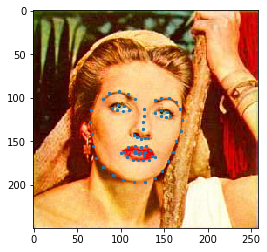

In [78]:
def show_landmarks(image, landmarks):
    """
    Args:
    - image
    - landmarks
    """
    plt.imshow(image)
    plt.scatter(landmarks[:,0], landmarks[:,1], s=5) #s参数调整点的大小
show_landmarks(im, landmarks)
plt.show()


# 封装

In [87]:
class FaceLandmarkDataset(Dataset):
    def __init__(self, csv_file, transform=None):
        self.landmarks = pd.read_csv(csv_file)
        self.root_dir = os.path.dirname(csv_file)
        self.transform = transform
        
    def __len__(self):
        return len(self.landmarks)
    
    def __getitem__(self, idx):
        """
        Args:
        - idx(int)
        Return:
        - sample(dict): {'image':...,'landmarks':...}
        """
        img_name = self.landmarks.iloc[idx, 0]
        
        im=io.imread(os.path.join(self.root_dir, img_name))
        
        landmarks = self.landmarks.iloc[idx, 1:].values 
        landmarks = landmarks.astype(np.float32).reshape(-1,2)
        sample = {'image':im, 'landmarks':landmarks}
        
        if self.transform:
            sample = self.transform(sample)
            
        return sample
        
        

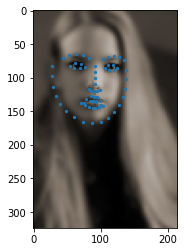

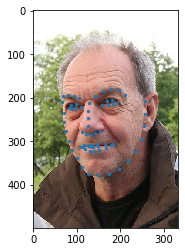

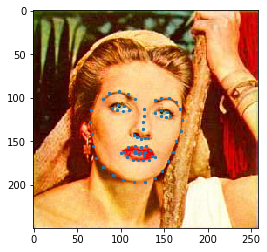

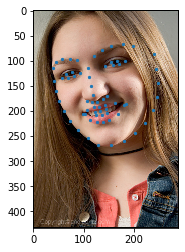

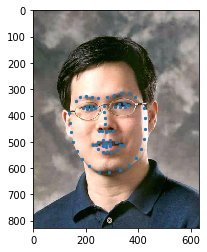

...

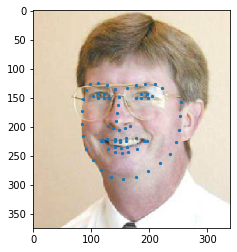

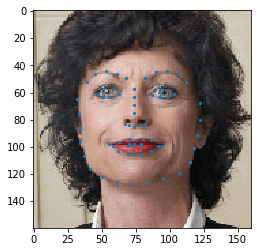

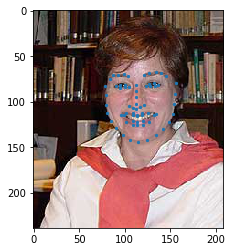

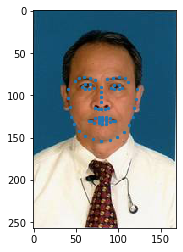

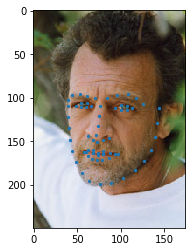

In [95]:
face_dataset = FaceLandmarkDataset("faces/face_landmarks.csv")

for i in range(len(face_dataset)):
    sample = face_dataset[i]
    show_landmarks(sample['image'], sample['landmarks'])
    #image对应图片，landmarks对应关键点
    plt.show()


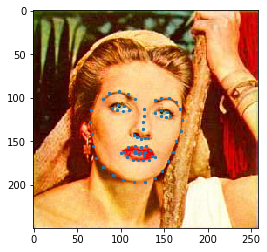

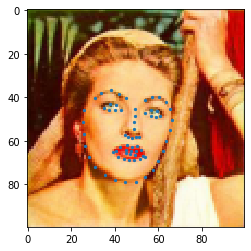

In [103]:
sample = face_dataset[2]
image, landmarks = sample['image'], sample['landmarks']
h, w = image.shape[:2]

new_h, new_w = 100, 100
new_image = transform.resize(image, (new_h, new_w))
new_landmarks = landmarks * [new_w/w, new_h/h]#坐标缩放

show_landmarks(image, landmarks)
plt.show()

show_landmarks(new_image, new_landmarks)
plt.show()

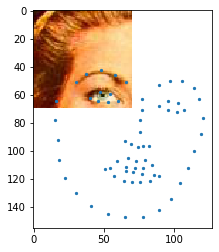

In [104]:
sample = face_dataset[2]
image, landmarks = sample['image'], sample['landmarks']
x1, y1 = (50, 50)
new_h, new_w = (70, 70)

new_image = image[y1:y1+new_h, x1:x1+new_w, :] #(H, W, C) C是像素值
new_landmarks = landmarks-[x1,y1]
show_landmarks(new_image, new_landmarks)
plt.show()

In [141]:
import random
class Resacle(object):
    def __init__(self, output_size):
        """
        Args:
        - output_size(tuple, int):(h, w)
        当为int类型时，将较短的变设置为output_size,另一条边等比例缩放
        """
        
        self.output_size = output_size
        
        
    def __call__(self, sample):
        image, landmarks = sample['image'], sample['landmarks']
        
        h, w = image.shape[:2]
        
        if isinstance(self.output_size, tuple): #isinstance判断变量类型
            new_h , new_w = self.output_size
        else:
            if h<w:
                new_h = self.output_size
                new_w = int(w*new_h/h)
            else:
                new_w = self.output_size
                new_h = int(h*new_w/w)
                
        
        new_image = transform.resize(image, (new_h, new_w))
        
        new_landmarks = landmarks * [new_w/w, new_h/h]#坐标缩放
        
        return {
            'image': new_image,
            'landmarks': new_landmarks
        }
    
class RandomCrop(object):
    def __init__(self, output_size):
        """
        Args:
        - output_size(tuple, int):(h, w)
        当为int类型时，(output_size, output_size)
        """
        
        self.output_size = output_size
        
    def __call__(self, sample):
        image, landmarks = sample['image'], sample['landmarks']

        h, w = image.shape[:2]

        
        
        
        if isinstance(self.output_size, tuple): #isinstance判断变量类型
            new_h , new_w = self.output_size
        else:
            new_h, new_w = (self.output_size, self.output_size)
        
            x1, y1 = random.randint(0, w-new_w), random.randint(0, h-new_h)
        
        new_image = image[y1:y1+new_h, x1:x1+new_w, :] #(H, W, C) C是像素值
        new_landmarks = landmarks-[x1,y1]
        show_landmarks(new_image, new_landmarks)

        return {
            'image':new_image,
            'landmarks':new_landmarks
        }

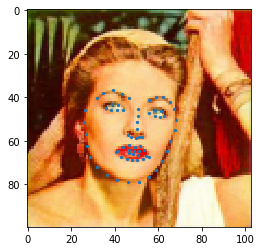

In [122]:
r = Resacle(100)
new_sample = r(face_dataset[2])
show_landmarks(new_sample['image'], new_sample['landmarks'])

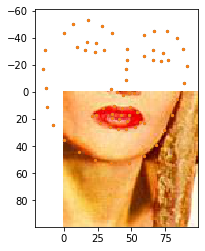

In [137]:
l = RandomCrop(100)
new_sample = l(face_dataset[2])
show_landmarks(new_sample['image'], new_sample['landmarks'])

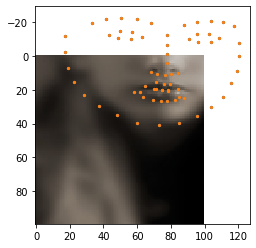

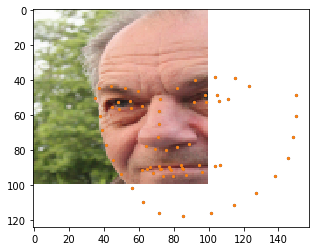

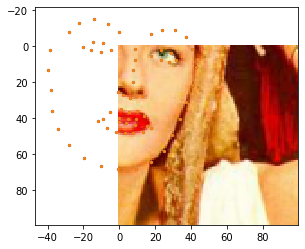

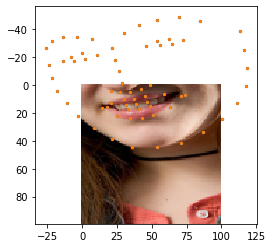

In [150]:
rescale = Resacle((200, 200))
random_crop = RandomCrop(100)
composed = transforms.Compose([
    rescale,
    random_crop
])#composed方法可以按顺序调用命名的方法

face_dataset = FaceLandmarkDataset("faces/face_landmarks.csv", composed)

for i in range(len(face_dataset)):
    sample = face_dataset[i]
    show_landmarks(sample['image'], sample['landmarks'])
    #image对应图片，landmarks对应关键点
    plt.show()
    if i==3:
        break

0


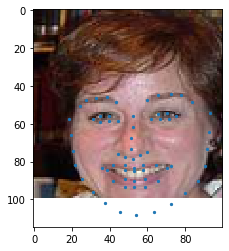

1


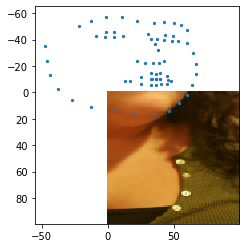

2


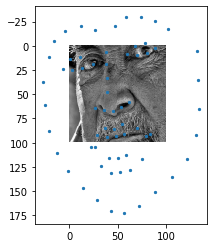

3


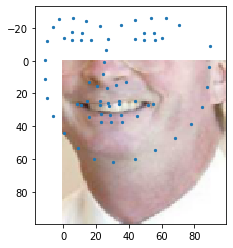

4


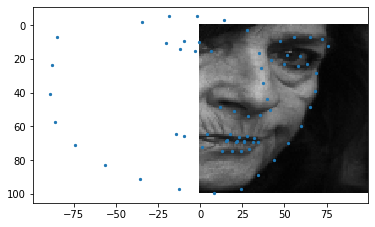

5


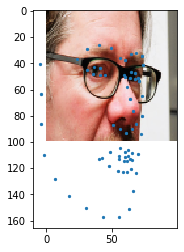

6


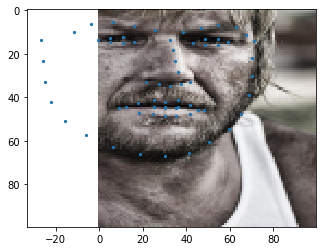

7


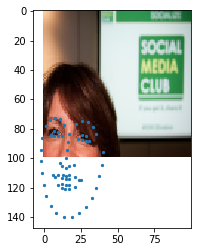

8


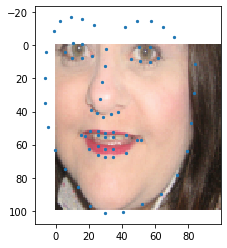

9


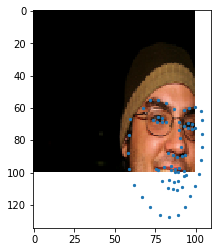

10


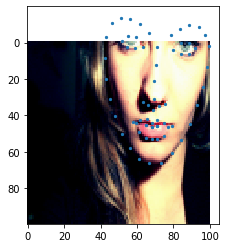

11


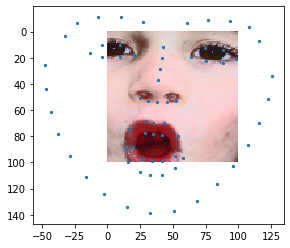

12


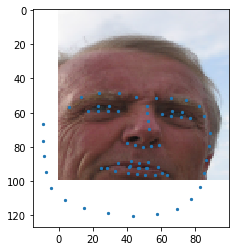

13


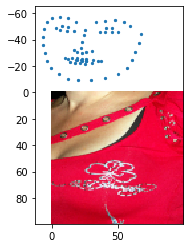

14


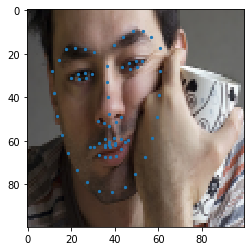

15


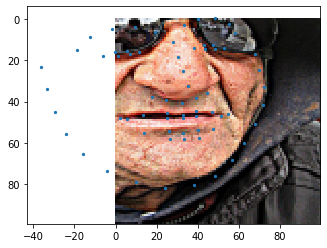

16


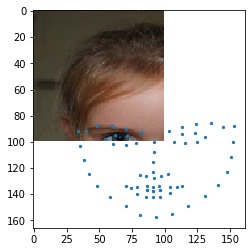

17


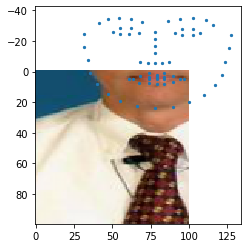

In [161]:
loader = DataLoader(face_dataset, shuffle=True, batch_size=4, num_workers=4)
for i_batch, sample_batch in enumerate(loader):
    print(i_batch)
    show_landmarks(sample_batch['image'][0], sample_batch['landmarks'][0])
    plt.show()
    